In [2]:
import os
import sys
import pandas as pd
import geopandas as gpd
import matplotlib
import matplotlib.pyplot as plt
from importlib import reload

In [3]:
sys.path.append("../../src")

In [4]:
import main

# Meteobikes

Meteobike data from 29th June 2022

In [5]:
mbike = pd.read_csv('/Users/lisawink/Documents/paper1/data/raw_data/ALL-SYSTEMS-2023-06-27.csv')

In [9]:
# take every 5 meteobike measurements
mbike.iloc[::50, :]

,System_ID,Time_UTC,Seconds_in_day,Altitude,Latitude,Longitude,Temperature_diff_K,Absolute_temperature_degC,Relhumidity_diff_percent,Relhumidity_percent,Vapourpressure_diff_hPa,Vapourpressure_hPa
0,1,2023-06-27T19:20:44.000Z,69643,256.9,47.992112,7.845233,1.30,23.53,-3.8,37.9,0.013,11.176
50,1,2023-06-27T19:32:22.000Z,70341,20.0,47.981182,7.839025,-0.42,21.58,0.3,42.3,-0.056,11.055
100,1,2023-06-27T19:43:49.000Z,71029,291.3,47.974940,7.847017,-3.77,18.09,18.3,60.7,1.613,12.731
150,1,2023-06-27T19:54:18.000Z,71658,281.9,47.985390,7.860123,-2.50,19.22,9.9,53.0,0.734,11.940
200,1,2023-06-27T20:05:02.000Z,72302,333.8,47.986148,7.860222,-1.91,19.52,8.2,52.0,0.764,11.945
...,...,...,...,...,...,...,...,...,...,...,...,...
5700,40,2023-06-27T20:04:01.000Z,72240,346.5,47.961500,7.862453,-3.99,17.51,20.6,64.2,1.783,12.968
5750,40,2023-06-27T20:09:28.000Z,72567,320.8,47.971320,7.844792,-3.27,18.12,16.0,60.2,1.404,12.637
5800,40,2023-06-27T20:15:15.000Z,72914,366.2,47.968180,7.836778,-3.88,17.41,14.6,60.4,0.539,12.122
5850,40,2023-06-27T20:20:47.000Z,73247,303.6,47.978850,7.839780,-2.35,18.83,8.1,55.6,0.282,12.212


In [10]:
bldgs = gpd.read_parquet('/Users/lisawink/Documents/paper1/data/processed_data/processed_buildings_3D.parquet')
streets = gpd.read_parquet('/Users/lisawink/Documents/paper1/data/processed_data/processed_streets.parquet')
nodes = gpd.read_parquet('/Users/lisawink/Documents/paper1/data/processed_data/processed_nodes.parquet')

# If running for the first time

In [6]:
i = 200
stn_buffers = main.buffer_stations(mbike, radius=200, input_crs='EPSG:4326', output_crs='EPSG:31468', lat_column = 'Latitude', lon_column = 'Longitude')
stn_buffers = main.neighbourhood_graph_params(bldgs, stn_buffers)
b,s,n = main.select_objects(bldgs, streets, nodes, stn_buffers)

/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/geopandas/geodataframe.py

In [7]:
stn_buffers = main.aggregate_params(b,s,n, stn_buffers)

/Users/lisawink/Documents/freiburg/src/main.py:357: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[[i+'_wmean',i+'_wstd',i+'_wmedian',i+'_wmin',i+'_wmax',i+'_wsum',i+'_wper25',i+'_wper75']] = selected_buildings.groupby('station_id')[[i,weight]].apply(weighted_stats, i, weight)
/Users/lisawink/Documents/freiburg/src/main.py:357: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[[i+'_wmean',i+'_wstd',i+'_wmedian',i+'_wmin',i+'_wmax',i+'_wsum',i+'_wper25',i+'_wper75']] = selected_buildings.groupby('station_id')[[i,weight]].apply(w

In [8]:
masked_svf_path = '/Users/lisawink/Documents/paper1/data/processed_data/SVF_street_buildings_only.tif'
stn_buffers = main.agg_raster(masked_svf_path, stn_buffers, 'SVF_3D')
stn_buffers.to_parquet('/Users/lisawink/Documents/paper1/data/processed_data/mbike/270623_processed_station_params_' + str(i) + '.parquet')

In [20]:
# up to radius 600m, every mbike measurement was takes
# radius 600-900m, every 5th measurement was taken
# radius 1000-1200m, every 15th measurement was taken
# radius 1500, every 30th measurement was taken
# radius 2000, every 100th measurement was taken
# radius 3000, every 200th measurement was taken


In [14]:
i = 1500

In [19]:
main.buffer_stations(mbike.iloc[::100, :], radius=i, input_crs='EPSG:4326', output_crs='EPSG:31468', lat_column = 'Latitude', lon_column = 'Longitude').explore()

In [22]:
radii = [3000]

for i in radii:
    stn_buffers = main.buffer_stations(mbike.iloc[::200, :], radius=i, input_crs='EPSG:4326', output_crs='EPSG:31468', lat_column = 'Latitude', lon_column = 'Longitude')
    stn_buffers = main.neighbourhood_graph_params(bldgs, stn_buffers)
    b,s,n = main.select_objects(bldgs, streets, nodes, stn_buffers)
    stn_buffers = main.aggregate_params(b,s,n, stn_buffers)
    masked_svf_path = '/Users/lisawink/Documents/paper1/data/processed_data/SVF_street_buildings_only.tif'
    stn_buffers = main.agg_raster(masked_svf_path, stn_buffers, 'SVF_3D')
    stn_buffers.to_parquet('/Users/lisawink/Documents/paper1/data/processed_data/mbike/270623_processed_station_params_' + str(i) + '.parquet')

/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/Users/lisawink/.conda/envs/py312_uscuni_buildingfootprints/lib/python3.12/site-packages/geopandas/geodataframe.py

: 

# If running again

In [5]:
stn_buffers =  gpd.read_parquet('/Users/lisawink/Documents/paper1/data/processed_data/mbike/processed_station_params_200.parquet')

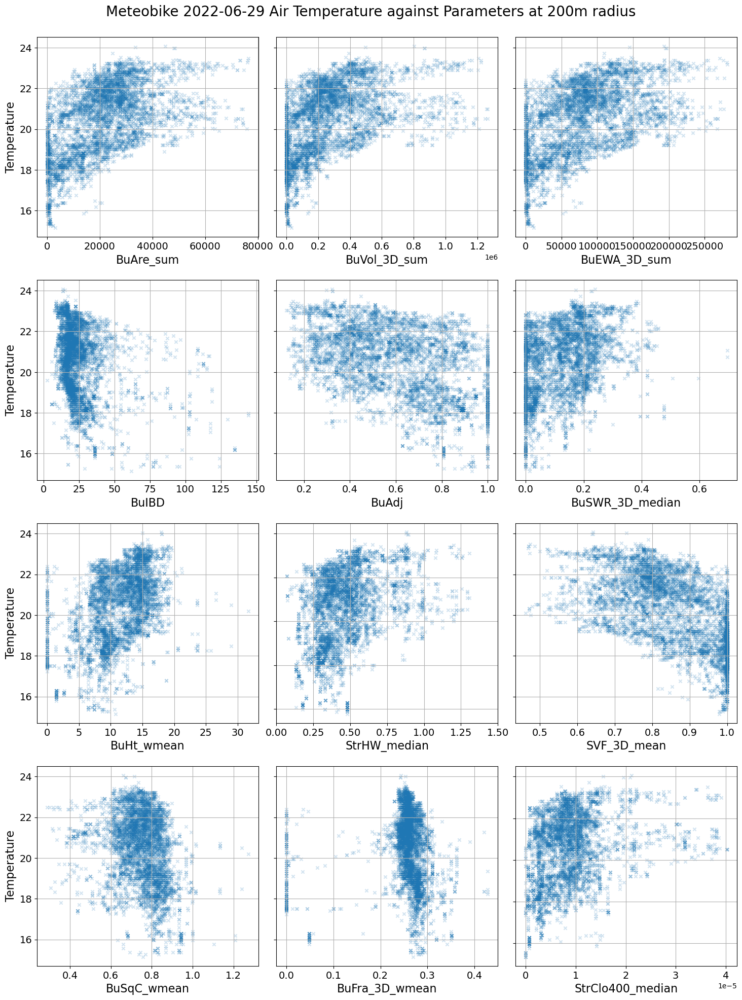

In [6]:
# make 3 by 4 plot with the following parameters
params = ['BuAre_sum', 'BuVol_3D_sum', 'BuEWA_3D_sum', 'BuIBD', 'BuAdj', 'BuSWR_3D_median', 'BuHt_wmean','StrHW_median','SVF_3D_mean', 'BuSqC_wmean','BuFra_3D_wmean', 'StrClo400_median']

fig, axs = plt.subplots(4, 3, figsize=(15, 20))
fig.suptitle('Meteobike 2022-06-29 Air Temperature against Parameters at 200m radius', fontsize=20, y=0.99)
#fig.subplots_adjust(wspace=0.1)
for i, ax in enumerate(axs.flat):
    if params[i] == 'StrHW_median':
        stn_buffers[['StrHW_median','Absolute_temperature_degC']].plot(x='StrHW_median', y='Absolute_temperature_degC', ax=ax, kind='scatter',marker='x',xlim=(0,1.5),alpha=0.2)
    else:
        stn_buffers[[params[i],'Absolute_temperature_degC']].plot(x=params[i], y='Absolute_temperature_degC', ax=ax, kind='scatter',marker='x',alpha=0.2)
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.set_xlabel(params[i],fontsize=16)
    ax.set_ylabel('Temperature',fontsize=16)
    ax.grid()

    if i % 3 != 0:  # 1st column (index 0, 3, 6, ...) keeps labels
        ax.set_ylabel("")  # Remove y-axis label
        ax.yaxis.set_ticklabels([])  # Remove y-axis ticks
        

plt.tight_layout(pad = 2, w_pad=0.01)
plt.savefig('/Users/lisawink/Documents/paper1/figures/270623_mbike_200m_new.png')
plt.savefig('/Users/lisawink/Documents/paper1/figures/270623_mbike_200m_new.pdf')
plt.show()

In [7]:
# add station temp to plot

temp =  pd.read_csv('/Users/lisawink/Documents/paper1/data/gap_filled_data_ta_rh.csv')
temp['datetime_UTC']=pd.to_datetime(temp['datetime_UTC'])
temp = temp[temp['variable']=='Ta_deg_C']
temp['datetime_UTC'] = temp['datetime_UTC'].astype(str)
temp = temp[temp['data_type'] == 'observed']
temp = temp.pivot(index='station_id', columns='datetime_UTC', values='value')

In [8]:
radius = 200
vars = gpd.read_parquet(f'/Users/lisawink/Documents/paper1/data/processed_data/processed_station_params_{radius}.parquet')
vars.index = vars['station_id']
to_remove = ['station_id','station_no','station_name','station_long_name','station_type','station_lat','station_lon','station_elevation','mounting_structure','sky_view_factor','dominant_land_use','local_climate_zone','urban_atlas_class','urban_atlas_code','geometry','SVF_3D']
vars = vars.drop(to_remove, axis=1)
vars = vars.merge(temp, left_on='station_id', right_on='station_id',how='inner')

In [9]:
vars['station_id'] = vars.index 

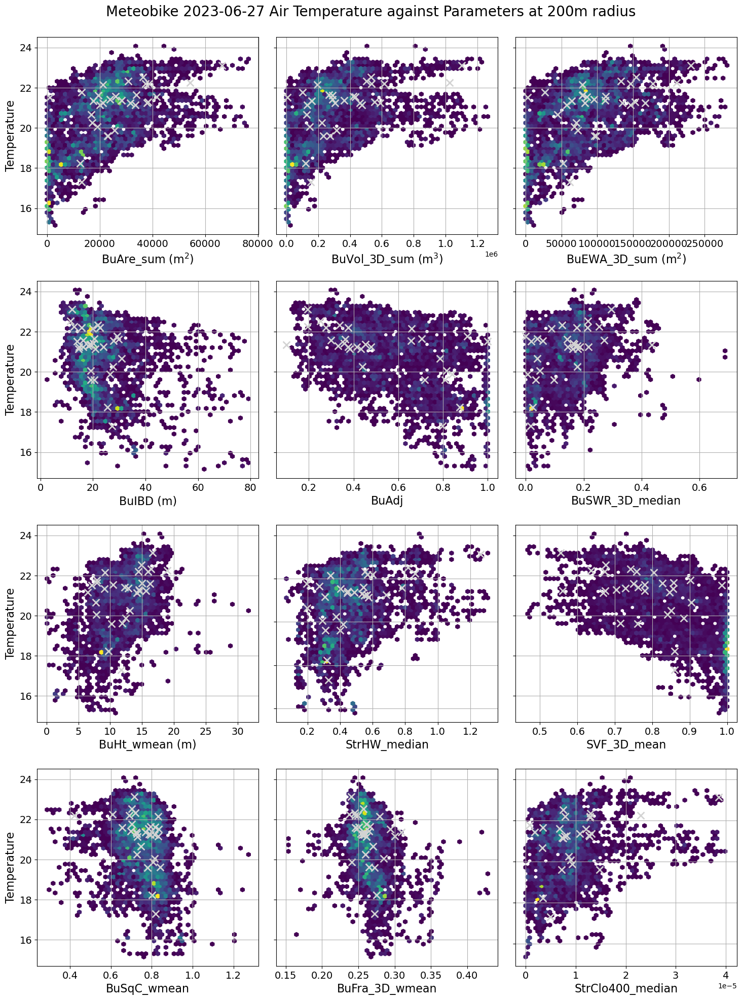

In [10]:
# make 3 by 4 plot with the following parameters
params = ['BuAre_sum', 'BuVol_3D_sum', 'BuEWA_3D_sum', 'BuIBD', 'BuAdj', 'BuSWR_3D_median', 'BuHt_wmean','StrHW_median','SVF_3D_mean', 'BuSqC_wmean','BuFra_3D_wmean', 'StrClo400_median']

fig, axs = plt.subplots(4, 3, figsize=(15, 20))
fig.suptitle('Meteobike 2023-06-27 Air Temperature against Parameters at 200m radius', fontsize=20, y=0.99)
#fig.subplots_adjust(wspace=0.1)
for i, ax in enumerate(axs.flat):
    if params[i] == 'BuAre_sum':
        ax.hexbin(stn_buffers['BuAre_sum'], stn_buffers['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')
        ax.scatter(vars['BuAre_sum'], vars['2023-06-27 20:00:00+00:00'], marker ='x', c='lightgrey', alpha =1,s=100,linewidths=2)
        ax.set_xlabel('BuAre_sum (m$^2$)',fontsize=16)
    elif params[i] == 'BuVol_3D_sum':
        ax.hexbin(stn_buffers[stn_buffers['BuVol_3D_sum']!=0]['BuVol_3D_sum'], stn_buffers[stn_buffers['BuVol_3D_sum']!=0]['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')
        ax.scatter(vars['BuVol_3D_sum'], vars['2023-06-27 20:00:00+00:00'], marker ='x', c='lightgrey', alpha =1,s=100,linewidths=2)
        ax.set_xlabel('BuVol_3D_sum (m$^3$)',fontsize=16)
    elif params[i] == 'BuEWA_3D_sum':
        ax.hexbin(stn_buffers[stn_buffers['BuEWA_3D_sum']!=0]['BuEWA_3D_sum'], stn_buffers[stn_buffers['BuEWA_3D_sum']!=0]['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')
        ax.scatter(vars['BuEWA_3D_sum'], vars['2023-06-27 20:00:00+00:00'], marker ='x', c='lightgrey', alpha =1,s=100,linewidths=2)
        ax.set_xlabel('BuEWA_3D_sum (m$^2$)',fontsize=16)
    elif params[i] == 'BuIBD':
        ax.hexbin(stn_buffers[stn_buffers['BuIBD']<80]['BuIBD'].astype(float), stn_buffers[stn_buffers['BuIBD']<80]['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')
        ax.scatter(vars['BuIBD'], vars['2023-06-27 20:00:00+00:00'], marker ='x', c='lightgrey', alpha =1,s=100,linewidths=2)
        ax.set_xlabel('BuIBD (m)',fontsize=16)
    elif params[i] == 'BuAdj':
        ax.hexbin(stn_buffers['BuAdj'], stn_buffers['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')
        ax.scatter(vars['BuAdj'], vars['2023-06-27 20:00:00+00:00'], marker ='x', c='lightgrey', alpha =1,s=100,linewidths=2)
        ax.set_xlabel('BuAdj',fontsize=16)
    elif params[i] == 'BuSWR_3D_median':
        ax.hexbin(stn_buffers[stn_buffers['BuSWR_3D_median']!=0]['BuSWR_3D_median'], stn_buffers[stn_buffers['BuSWR_3D_median']!=0]['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')
        ax.scatter(vars['BuSWR_3D_median'], vars['2023-06-27 20:00:00+00:00'], marker ='x', c='lightgrey', alpha =1,s=100,linewidths=2)
        ax.set_xlabel('BuSWR_3D_median',fontsize=16)
    elif params[i] == 'BuHt_wmean':
        ax.hexbin(stn_buffers[stn_buffers['BuHt_wmean']!=0]['BuHt_wmean'], stn_buffers[stn_buffers['BuHt_wmean']!=0]['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')
        ax.scatter(vars['BuHt_wmean'], vars['2023-06-27 20:00:00+00:00'], marker ='x', c='lightgrey', alpha =1,s=100,linewidths=2)
        ax.set_xlabel('BuHt_wmean (m)',fontsize=16)
    elif params[i] == 'StrHW_median':
        ax.hexbin(stn_buffers[stn_buffers['StrHW_median']<10]['StrHW_median'],stn_buffers[stn_buffers['StrHW_median']<10]['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')
        ax.scatter(vars['StrHW_median'], vars['2023-06-27 20:00:00+00:00'], marker ='x', c='lightgrey', alpha =1,s=100,linewidths=2)
        ax.set_xlabel('StrHW_median',fontsize=16)
        #ax.set_xlim(0,1.5)
    elif params[i] == 'SVF_3D_mean':
        ax.hexbin(stn_buffers['SVF_3D_mean'], stn_buffers['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')
        ax.scatter(vars['SVF_3D_mean'], vars['2023-06-27 20:00:00+00:00'], marker ='x', c='lightgrey', alpha =1,s=100,linewidths=2)
        ax.set_xlabel('SVF_3D_mean',fontsize=16)
    elif params[i] == 'BuSqC_wmean':
        ax.hexbin(stn_buffers['BuSqC_wmean'], stn_buffers['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')
        ax.scatter(vars['BuSqC_wmean'], vars['2023-06-27 20:00:00+00:00'], marker ='x', c='lightgrey', alpha =1,s=100,linewidths=2)
        ax.set_xlabel('BuSqC_wmean',fontsize=16)
    elif params[i] == 'BuFra_3D_wmean':
        ax.hexbin(stn_buffers[stn_buffers['BuFra_3D_wmean']>0.15]['BuFra_3D_wmean'], stn_buffers[stn_buffers['BuFra_3D_wmean']>0.15]['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')    
        ax.scatter(vars['BuFra_3D_wmean'], vars['2023-06-27 20:00:00+00:00'], marker ='x', c='lightgrey', alpha =1,s=100,linewidths=2)
        ax.set_xlabel('BuFra_3D_wmean',fontsize=16)
    elif params[i] == 'StrClo400_median':
        ax.hexbin(stn_buffers['StrClo400_median'], stn_buffers['Absolute_temperature_degC'],mincnt=1, gridsize=50, cmap='viridis')
        ax.scatter(vars['StrClo400_median'], vars['2023-06-27 20:00:00+00:00'], marker ='x', c='lightgrey', alpha =1,s=100,linewidths=2)
        ax.set_xlabel('StrClo400_median',fontsize=16)
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.set_ylabel('Temperature',fontsize=16)
    ax.grid()

    if i % 3 != 0:  # 1st column (index 0, 3, 6, ...) keeps labels
        ax.set_ylabel("")  # Remove y-axis label
        ax.yaxis.set_ticklabels([])  # Remove y-axis ticks
         

plt.tight_layout(pad = 2, w_pad=0.01)
plt.savefig('/Users/lisawink/Documents/paper1/figures/270623_mbike_200m_new.png')
plt.savefig('/Users/lisawink/Documents/paper1/figures/270623_mbike_200m_new.pdf')
plt.show()

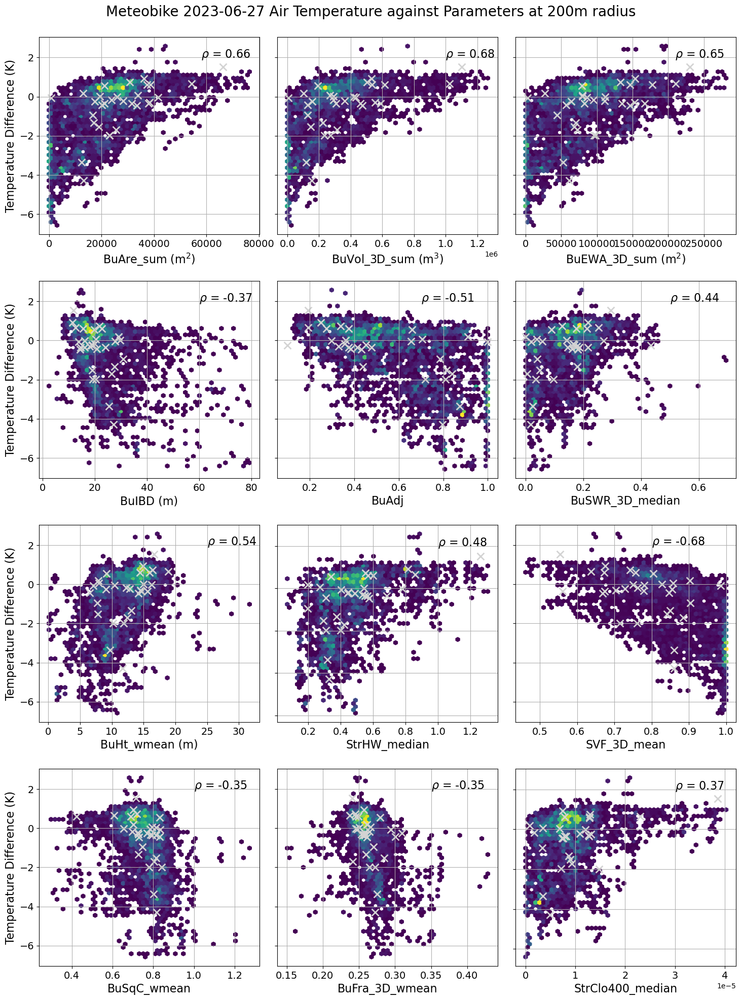

In [31]:
# make 3 by 4 plot with the following parameters
params = ['BuAre_sum', 'BuVol_3D_sum', 'BuEWA_3D_sum', 'BuIBD', 'BuAdj', 'BuSWR_3D_median', 'BuHt_wmean','StrHW_median','SVF_3D_mean', 'BuSqC_wmean','BuFra_3D_wmean', 'StrClo400_median']

fig, axs = plt.subplots(4, 3, figsize=(15, 20))
fig.suptitle('Meteobike 2023-06-27 Air Temperature against Parameters at 200m radius', fontsize=20, y=0.99)
#fig.subplots_adjust(wspace=0.1)
for i, ax in enumerate(axs.flat):
    if params[i] == 'BuAre_sum':
        ax.hexbin(stn_buffers['BuAre_sum'], stn_buffers['Temperature_diff_K'],mincnt=1, gridsize=50, cmap='viridis')
        ax.scatter(vars['BuAre_sum'], vars['2023-06-27 20:00:00+00:00']-21.59, marker ='x', c='lightgrey', alpha =1,s=100,linewidths=2)
        ax.set_xlabel('BuAre_sum (m$^2$)',fontsize=16)
        ax.text(58000,2, r"$\rho$ = 0.66",fontsize=16)
    elif params[i] == 'BuVol_3D_sum':
        ax.hexbin(stn_buffers[stn_buffers['BuVol_3D_sum']!=0]['BuVol_3D_sum'], stn_buffers[stn_buffers['BuVol_3D_sum']!=0]['Temperature_diff_K'],mincnt=1, gridsize=50, cmap='viridis')
        ax.scatter(vars['BuVol_3D_sum'], vars['2023-06-27 20:00:00+00:00']-21.59, marker ='x', c='lightgrey', alpha =1,s=100,linewidths=2)
        ax.set_xlabel('BuVol_3D_sum (m$^3$)',fontsize=16)
        ax.text(1000000,2, r"$\rho$ = 0.68",fontsize=16)
    elif params[i] == 'BuEWA_3D_sum':
        ax.hexbin(stn_buffers[stn_buffers['BuEWA_3D_sum']!=0]['BuEWA_3D_sum'], stn_buffers[stn_buffers['BuEWA_3D_sum']!=0]['Temperature_diff_K'],mincnt=1, gridsize=50, cmap='viridis')
        ax.scatter(vars['BuEWA_3D_sum'], vars['2023-06-27 20:00:00+00:00']-21.59, marker ='x', c='lightgrey', alpha =1,s=100,linewidths=2)
        ax.set_xlabel('BuEWA_3D_sum (m$^2$)',fontsize=16)
        ax.text(210000,2, r"$\rho$ = 0.65",fontsize=16)
    elif params[i] == 'BuIBD':
        ax.hexbin(stn_buffers[stn_buffers['BuIBD']<80]['BuIBD'].astype(float), stn_buffers[stn_buffers['BuIBD']<80]['Temperature_diff_K'],mincnt=1, gridsize=50, cmap='viridis')
        ax.scatter(vars['BuIBD'], vars['2023-06-27 20:00:00+00:00']-21.59, marker ='x', c='lightgrey', alpha =1,s=100,linewidths=2)
        ax.set_xlabel('BuIBD (m)',fontsize=16)
        ax.text(60,2, r"$\rho$ = -0.37",fontsize=16)
    elif params[i] == 'BuAdj':
        ax.hexbin(stn_buffers['BuAdj'], stn_buffers['Temperature_diff_K'],mincnt=1, gridsize=50, cmap='viridis')
        ax.scatter(vars['BuAdj'], vars['2023-06-27 20:00:00+00:00']-21.59, marker ='x', c='lightgrey', alpha =1,s=100,linewidths=2)
        ax.set_xlabel('BuAdj',fontsize=16)
        ax.text(0.7,2, r"$\rho$ = -0.51",fontsize=16)
    elif params[i] == 'BuSWR_3D_median':
        ax.hexbin(stn_buffers[stn_buffers['BuSWR_3D_median']!=0]['BuSWR_3D_median'], stn_buffers[stn_buffers['BuSWR_3D_median']!=0]['Temperature_diff_K'],mincnt=1, gridsize=50, cmap='viridis')
        ax.scatter(vars['BuSWR_3D_median'], vars['2023-06-27 20:00:00+00:00']-21.59, marker ='x', c='lightgrey', alpha =1,s=100,linewidths=2)
        ax.set_xlabel('BuSWR_3D_median',fontsize=16)
        ax.text(0.5,2, r"$\rho$ = 0.44",fontsize=16)
    elif params[i] == 'BuHt_wmean':
        ax.hexbin(stn_buffers[stn_buffers['BuHt_wmean']!=0]['BuHt_wmean'], stn_buffers[stn_buffers['BuHt_wmean']!=0]['Temperature_diff_K'],mincnt=1, gridsize=50, cmap='viridis')
        ax.scatter(vars['BuHt_wmean'], vars['2023-06-27 20:00:00+00:00']-21.59, marker ='x', c='lightgrey', alpha =1,s=100,linewidths=2)
        ax.set_xlabel('BuHt_wmean (m)',fontsize=16)
        ax.text(25,2, r"$\rho$ = 0.54",fontsize=16)
    elif params[i] == 'StrHW_median':
        ax.hexbin(stn_buffers[stn_buffers['StrHW_median']<10]['StrHW_median'],stn_buffers[stn_buffers['StrHW_median']<10]['Temperature_diff_K'],mincnt=1, gridsize=50, cmap='viridis')
        ax.scatter(vars['StrHW_median'], vars['2023-06-27 20:00:00+00:00']-21.59, marker ='x', c='lightgrey', alpha =1,s=100,linewidths=2)
        ax.set_xlabel('StrHW_median',fontsize=16)
        ax.text(1,2, r"$\rho$ = 0.48",fontsize=16)
        #ax.set_xlim(0,1.5)
    elif params[i] == 'SVF_3D_mean':
        ax.hexbin(stn_buffers['SVF_3D_mean'], stn_buffers['Temperature_diff_K'],mincnt=1, gridsize=50, cmap='viridis')
        ax.scatter(vars['SVF_3D_mean'], vars['2023-06-27 20:00:00+00:00']-21.59, marker ='x', c='lightgrey', alpha =1,s=100,linewidths=2)
        ax.set_xlabel('SVF_3D_mean',fontsize=16)
        ax.text(0.8,2, r"$\rho$ = -0.68",fontsize=16)
    elif params[i] == 'BuSqC_wmean':
        ax.hexbin(stn_buffers['BuSqC_wmean'], stn_buffers['Temperature_diff_K'],mincnt=1, gridsize=50, cmap='viridis')
        ax.scatter(vars['BuSqC_wmean'], vars['2023-06-27 20:00:00+00:00']-21.59, marker ='x', c='lightgrey', alpha =1,s=100,linewidths=2)
        ax.set_xlabel('BuSqC_wmean',fontsize=16)
        ax.text(1,2, r"$\rho$ = -0.35",fontsize=16)
    elif params[i] == 'BuFra_3D_wmean':
        ax.hexbin(stn_buffers[stn_buffers['BuFra_3D_wmean']>0.15]['BuFra_3D_wmean'], stn_buffers[stn_buffers['BuFra_3D_wmean']>0.15]['Temperature_diff_K'],mincnt=1, gridsize=50, cmap='viridis')    
        ax.scatter(vars['BuFra_3D_wmean'], vars['2023-06-27 20:00:00+00:00']-21.59, marker ='x', c='lightgrey', alpha =1,s=100,linewidths=2)
        ax.set_xlabel('BuFra_3D_wmean',fontsize=16)
        ax.text(0.35,2, r"$\rho$ = -0.35",fontsize=16)
    elif params[i] == 'StrClo400_median':
        ax.hexbin(stn_buffers['StrClo400_median'], stn_buffers['Temperature_diff_K'],mincnt=1, gridsize=50, cmap='viridis')
        ax.scatter(vars['StrClo400_median'], vars['2023-06-27 20:00:00+00:00']-21.59, marker ='x', c='lightgrey', alpha =1,s=100,linewidths=2)
        ax.set_xlabel('StrClo400_median',fontsize=16)
        ax.text(0.00003,2, r"$\rho$ = 0.37",fontsize=16)
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.set_ylabel('Temperature Difference (K)',fontsize=16)
    ax.grid()

    if i % 3 != 0:  # 1st column (index 0, 3, 6, ...) keeps labels
        ax.set_ylabel("")  # Remove y-axis label
        ax.yaxis.set_ticklabels([])  # Remove y-axis ticks
         

plt.tight_layout(pad = 2, w_pad=0.01)
plt.savefig('/Users/lisawink/Documents/paper1/figures/270623_mbike_200m_new_tdiff.png')
plt.savefig('/Users/lisawink/Documents/paper1/figures/270623_mbike_200m_new_tdiff.pdf')
plt.show()

In [18]:
# spearman correlation of data
from scipy.stats import pearsonr, spearmanr

for i in params:

    data = stn_buffers[[i,'Temperature_diff_K']].dropna()
    spearman = spearmanr(data[i], data['Temperature_diff_K'])
    print(i, spearman)



BuAre_sum SignificanceResult(statistic=0.6595446026309225, pvalue=0.0)
BuVol_3D_sum SignificanceResult(statistic=0.6754564213413152, pvalue=0.0)
BuEWA_3D_sum SignificanceResult(statistic=0.6464456493042996, pvalue=0.0)
BuIBD SignificanceResult(statistic=-0.3650990346477889, pvalue=4.416598902845225e-160)
BuAdj SignificanceResult(statistic=-0.5110246801105797, pvalue=0.0)
BuSWR_3D_median SignificanceResult(statistic=0.4365584532283494, pvalue=1.7724984108738075e-240)
BuHt_wmean SignificanceResult(statistic=0.5365278966381581, pvalue=0.0)
StrHW_median SignificanceResult(statistic=0.4764978782734741, pvalue=5.457762178958303e-269)
SVF_3D_mean SignificanceResult(statistic=-0.6759599423793231, pvalue=0.0)
BuSqC_wmean SignificanceResult(statistic=-0.34774700459907004, pvalue=1.1738877183547043e-151)
BuFra_3D_wmean SignificanceResult(statistic=-0.3465747607881702, pvalue=1.3931855849034476e-150)
StrClo400_median SignificanceResult(statistic=0.371244154689196, pvalue=4.6533310673873526e-163)


In [32]:
i='BuSWR_median'
data = stn_buffers[[i,'Temperature_diff_K']].dropna()
spearman = spearmanr(data[i], data['Temperature_diff_K'])
print(i, spearman)

BuSWR_median SignificanceResult(statistic=0.4931647864938912, pvalue=0.0)


In [33]:
i='BuSWR_mean'
data = stn_buffers[[i,'Temperature_diff_K']].dropna()
spearman = spearmanr(data[i], data['Temperature_diff_K'])
print(i, spearman)

BuSWR_mean SignificanceResult(statistic=0.5066096972632727, pvalue=0.0)


In [34]:
i='BuSWR_3D_mean'
data = stn_buffers[[i,'Temperature_diff_K']].dropna()
spearman = spearmanr(data[i], data['Temperature_diff_K'])
print(i, spearman)

BuSWR_3D_mean SignificanceResult(statistic=0.44549194631683453, pvalue=1.6633000379177181e-251)


In [35]:
i='BuHt_mean'
data = stn_buffers[[i,'Temperature_diff_K']].dropna()
spearman = spearmanr(data[i], data['Temperature_diff_K'])
print(i, spearman)

BuHt_mean SignificanceResult(statistic=0.48632742405473317, pvalue=2.5195428813804292e-306)


In [36]:
i='BuHt_median'
data = stn_buffers[[i,'Temperature_diff_K']].dropna()
spearman = spearmanr(data[i], data['Temperature_diff_K'])
print(i, spearman)

BuHt_median SignificanceResult(statistic=0.46032392217148044, pvalue=1.4704695328000609e-270)


In [37]:
i='BuHt_wmedian'
data = stn_buffers[[i,'Temperature_diff_K']].dropna()
spearman = spearmanr(data[i], data['Temperature_diff_K'])
print(i, spearman)

BuHt_wmedian SignificanceResult(statistic=0.4570739034061414, pvalue=1.558031406214249e-262)


In [38]:
i='StrHW_mean'
data = stn_buffers[[i,'Temperature_diff_K']].dropna()
spearman = spearmanr(data[i], data['Temperature_diff_K'])
print(i, spearman)

StrHW_mean SignificanceResult(statistic=0.49326198420673995, pvalue=5.169706724499777e-291)


In [41]:
i='BuSqC_wmedian'
data = stn_buffers[[i,'Temperature_diff_K']].dropna()
spearman = spearmanr(data[i], data['Temperature_diff_K'])
print(i, spearman)

BuSqC_wmedian SignificanceResult(statistic=-0.3003030666755747, pvalue=9.749988677530103e-112)


In [48]:
i='BuSqC_mean'
data = stn_buffers[[i,'Temperature_diff_K']].dropna()
spearman = spearmanr(data[i], data['Temperature_diff_K'])
print(i, spearman)

BuSqC_mean SignificanceResult(statistic=-0.2525596796990589, pvalue=1.6598465925716438e-78)


In [42]:
i='BuCCo_wmean'
data = stn_buffers[[i,'Temperature_diff_K']].dropna()
spearman = spearmanr(data[i], data['Temperature_diff_K'])
print(i, spearman)

BuCCo_wmean SignificanceResult(statistic=-0.37105130500233324, pvalue=5.450648137222511e-174)


In [43]:
i='BuCCo_mean'
data = stn_buffers[[i,'Temperature_diff_K']].dropna()
spearman = spearmanr(data[i], data['Temperature_diff_K'])
print(i, spearman)

BuCCo_mean SignificanceResult(statistic=-0.3329381373350235, pvalue=2.0271728248584138e-138)


In [49]:
i='BuCCo_median'
data = stn_buffers[[i,'Temperature_diff_K']].dropna()
spearman = spearmanr(data[i], data['Temperature_diff_K'])
print(i, spearman)

BuCCo_median SignificanceResult(statistic=-0.2660867712825855, pvalue=2.998547464827431e-87)


In [46]:
i='BuCCo_wmedian'
data = stn_buffers[[i,'Temperature_diff_K']].dropna()
spearman = spearmanr(data[i], data['Temperature_diff_K'])
print(i, spearman)

BuCCo_wmedian SignificanceResult(statistic=-0.3037711308146176, pvalue=2.0484032017587853e-114)


In [59]:
i='BuSqu_wmedian'
data = stn_buffers[[i,'Temperature_diff_K']].dropna()
spearman = spearmanr(data[i], data['Temperature_diff_K'])
print(i, spearman)

BuSqu_wmedian SignificanceResult(statistic=-0.2342041695551, pvalue=1.1023067471196895e-64)


In [64]:
i='BuCube_3D_median'
data = stn_buffers[[i,'Temperature_diff_K']].dropna()
spearman = spearmanr(data[i], data['Temperature_diff_K'])
print(i, spearman)

BuCube_3D_median SignificanceResult(statistic=-0.06398972864893238, pvalue=3.967086593061036e-06)


In [66]:
i='BuCubo_3D_wmedian'
data = stn_buffers[[i,'Temperature_diff_K']].dropna()
spearman = spearmanr(data[i], data['Temperature_diff_K'])
print(i, spearman)

BuCubo_3D_wmedian SignificanceResult(statistic=-0.12946792903310686, pvalue=1.4537402640314943e-20)


In [15]:
stn_buffers

,System_ID,Time_UTC,Seconds_in_day,Altitude,Latitude,Longitude,Temperature_diff_K,Absolute_temperature_degC,Relhumidity_diff_percent,Relhumidity_percent,...,StrSCl_MAD,StrSCl_skew,StrSCl_per25,StrSCl_per75,BuCAR,SVF_3D,SVF_3D_mean,SVF_3D_std,SVF_3D_median,SVF_3D_IQR
0,1,2023-06-27T19:20:44.000Z,69643,256.9,47.992112,7.845233,1.30,23.53,-3.8,37.9,...,0.045455,0.358510,0.000000,0.076923,0.271903,"{'count': 70878, 'max': 1.0, 'mean': 0.7177317...",0.717732,0.216597,0.753797,0.393082
1,1,2023-06-27T19:20:51.000Z,69651,258.8,47.991700,7.845267,1.10,23.33,-3.7,37.9,...,0.024242,0.185383,0.000000,0.076923,0.231572,"{'count': 77662, 'max': 1.0, 'mean': 0.7601647...",0.760165,0.211641,0.844074,0.358620
2,1,2023-06-27T19:21:05.000Z,69665,257.5,47.991107,7.845255,1.02,23.22,-3.2,38.2,...,0.024242,0.640668,0.019231,0.076923,0.220690,"{'count': 78997, 'max': 1.0, 'mean': 0.7774007...",0.777401,0.203327,0.864489,0.321352
3,1,2023-06-27T19:21:14.000Z,69673,261.4,47.991080,7.845272,1.02,23.22,-3.1,38.3,...,0.024242,0.640668,0.019231,0.076923,0.222072,"{'count': 79073, 'max': 1.0, 'mean': 0.7771104...",0.777110,0.202978,0.863095,0.321584
4,1,2023-06-27T19:21:42.000Z,69702,258.3,47.990405,7.844355,1.02,23.22,-2.5,38.9,...,0.012121,0.367753,0.032609,0.076923,0.205639,"{'count': 82746, 'max': 1.0, 'mean': 0.7872976...",0.787298,0.186119,0.845826,0.289050
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5936,40,2023-06-27T20:30:44.000Z,73843,266.5,47.991900,7.845425,-0.75,20.16,3.6,50.9,...,0.038462,0.437603,0.000000,0.076923,0.253987,"{'count': 73987, 'max': 1.0, 'mean': 0.7420448...",0.742045,0.213958,0.800480,0.378475
5937,40,2023-06-27T20:30:46.000Z,73846,267.0,47.991982,7.845422,-0.54,20.36,2.6,49.8,...,0.038462,0.437603,0.000000,0.076923,0.260299,"{'count': 72773, 'max': 1.0, 'mean': 0.7308574...",0.730857,0.214830,0.777197,0.387537
5938,40,2023-06-27T20:30:50.000Z,73849,267.0,47.992112,7.845410,-0.44,20.46,2.4,49.6,...,0.038462,0.455691,0.000000,0.076923,0.267029,"{'count': 70454, 'max': 1.0, 'mean': 0.7126042...",0.712604,0.214581,0.744967,0.386357
5939,40,2023-06-27T20:30:53.000Z,73853,269.8,47.992188,7.845352,-0.44,20.46,2.3,49.5,...,0.000000,0.630329,0.000000,0.076923,0.275620,"{'count': 69076, 'max': 1.0, 'mean': 0.7033730...",0.703373,0.213794,0.729211,0.382488


In [14]:
stn_buffers[['BuAre_sum','Temperature_diff_K']].dropna()

,BuAre_sum,Temperature_diff_K
0,34113.444070,1.30
1,29053.491698,1.10
2,27688.242618,1.02
3,27861.634070,1.02
4,25799.810208,1.02
...,...,...
5936,31865.650102,-0.75
5937,32657.568192,-0.54
5938,33501.985572,-0.44
5939,34579.794039,-0.44


In [13]:
stn_buffers['BuAre_sum'], stn_buffers['Temperature_diff_K']

(0       34113.444070
 1       29053.491698
 2       27688.242618
 3       27861.634070
 4       25799.810208
             ...     
 5936    31865.650102
 5937    32657.568192
 5938    33501.985572
 5939    34579.794039
 5940    34398.112054
 Name: BuAre_sum, Length: 5941, dtype: float64,
 0       1.30
 1       1.10
 2       1.02
 3       1.02
 4       1.02
         ... 
 5936   -0.75
 5937   -0.54
 5938   -0.44
 5939   -0.44
 5940   -0.44
 Name: Temperature_diff_K, Length: 5941, dtype: float64)

In [68]:
for i in stn_buffers.columns:
    print(i)

System_ID
Time_UTC
Seconds_in_day
Altitude
Latitude
Longitude
Temperature_diff_K
Absolute_temperature_degC
Relhumidity_diff_percent
Relhumidity_percent
Vapourpressure_diff_hPa
Vapourpressure_hPa
geometry
station_id
BuAdj
BuIBD
BuAre_mean
BuAre_median
BuAre_std
BuAre_min
BuAre_max
BuAre_sum
BuAre_mode
BuAre_IQR
BuAre_MAD
BuAre_skew
BuAre_per25
BuAre_per75
BuNum
BuHt_mean
BuHt_median
BuHt_std
BuHt_min
BuHt_max
BuHt_sum
BuHt_mode
BuHt_wmean
BuHt_wstd
BuHt_wmedian
BuHt_wmin
BuHt_wmax
BuHt_wsum
BuHt_wper25
BuHt_wper75
BuHt_IQR
BuHt_MAD
BuHt_skew
BuHt_per25
BuHt_per75
BuPer_mean
BuPer_median
BuPer_std
BuPer_min
BuPer_max
BuPer_sum
BuPer_mode
BuPer_wmean
BuPer_wstd
BuPer_wmedian
BuPer_wmin
BuPer_wmax
BuPer_wsum
BuPer_wper25
BuPer_wper75
BuPer_IQR
BuPer_MAD
BuPer_skew
BuPer_per25
BuPer_per75
BuLAL_mean
BuLAL_median
BuLAL_std
BuLAL_min
BuLAL_max
BuLAL_sum
BuLAL_mode
BuLAL_wmean
BuLAL_wstd
BuLAL_wmedian
BuLAL_wmin
BuLAL_wmax
BuLAL_wsum
BuLAL_wper25
BuLAL_wper75
BuLAL_IQR
BuLAL_MAD
BuLAL_skew
BuL

In [ ]:
# drop System_ID
Time_UTC
Seconds_in_day
Altitude
Latitude
Longitude
Temperature_diff_K
Absolute_temperature_degC
Relhumidity_diff_percent
Relhumidity_percent
Vapourpressure_diff_hPa
Vapourpressure_hPa
geometry
station_id

stn_buffers = stn_buffers.drop(['System_ID','Time_UTC','Seconds_in_day','Altitude','Latitude','Longitude','Temperature_diff_K','Absolute_temperature_degC','Relhumidity_diff_percent','Relhumidity_percent','Vapourpressure_diff_hPa','Vapourpressure_hPa','geometry'], axis=1)

In [74]:
spearman_df = {}

In [ ]:
# add to dict


In [94]:
param_list = []
spearman_r_list = []
spearman_p_list = []

for i in stn_buffers.drop(['station_id','System_ID','Time_UTC','Seconds_in_day','Altitude','Latitude','Longitude','Temperature_diff_K','Absolute_temperature_degC','Relhumidity_diff_percent','Relhumidity_percent','Vapourpressure_diff_hPa','Vapourpressure_hPa','geometry','SVF_3D'], axis=1).columns:
    print(i)
    data = stn_buffers[[i,'Temperature_diff_K']].dropna()
    spearman_r, spearman_p = spearmanr(data[i], data['Temperature_diff_K'])
    param_list.append(i)
    spearman_r_list.append(spearman_r)
    spearman_p_list.append(spearman_p)

spearman_df['parameter'] = param_list
spearman_df['spearman_r'] = spearman_r_list
spearman_df['spearman_p'] = spearman_p_list

spearman_df = pd.DataFrame(spearman_df)


BuAdj
BuIBD
BuAre_mean
BuAre_median
BuAre_std
BuAre_min
BuAre_max
BuAre_sum
BuAre_mode
BuAre_IQR
BuAre_MAD
BuAre_skew
BuAre_per25
BuAre_per75
BuNum
BuHt_mean
BuHt_median
BuHt_std
BuHt_min
BuHt_max
BuHt_sum
BuHt_mode
BuHt_wmean
BuHt_wstd
BuHt_wmedian
BuHt_wmin
BuHt_wmax
BuHt_wsum
BuHt_wper25
BuHt_wper75
BuHt_IQR
BuHt_MAD
BuHt_skew
BuHt_per25
BuHt_per75
BuPer_mean
BuPer_median
BuPer_std
BuPer_min
BuPer_max
BuPer_sum
BuPer_mode
BuPer_wmean
BuPer_wstd
BuPer_wmedian
BuPer_wmin
BuPer_wmax
BuPer_wsum
BuPer_wper25
BuPer_wper75
BuPer_IQR
BuPer_MAD
BuPer_skew
BuPer_per25
BuPer_per75
BuLAL_mean
BuLAL_median
BuLAL_std
BuLAL_min
BuLAL_max
BuLAL_sum
BuLAL_mode
BuLAL_wmean
BuLAL_wstd
BuLAL_wmedian
BuLAL_wmin
BuLAL_wmax
BuLAL_wsum
BuLAL_wper25
BuLAL_wper75


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_98881/2899159179.py:8: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_r, spearman_p = spearmanr(data[i], data['Temperature_diff_K'])


BuLAL_IQR
BuLAL_MAD
BuLAL_skew
BuLAL_per25
BuLAL_per75
BuCCD_mean_mean
BuCCD_mean_median
BuCCD_mean_std
BuCCD_mean_min
BuCCD_mean_max
BuCCD_mean_sum
BuCCD_mean_mode
BuCCD_mean_wmean
BuCCD_mean_wstd
BuCCD_mean_wmedian
BuCCD_mean_wmin
BuCCD_mean_wmax
BuCCD_mean_wsum
BuCCD_mean_wper25
BuCCD_mean_wper75
BuCCD_mean_IQR
BuCCD_mean_MAD
BuCCD_mean_skew
BuCCD_mean_per25
BuCCD_mean_per75
BuCCD_std_mean
BuCCD_std_median
BuCCD_std_std
BuCCD_std_min
BuCCD_std_max
BuCCD_std_sum
BuCCD_std_mode
BuCCD_std_wmean
BuCCD_std_wstd
BuCCD_std_wmedian
BuCCD_std_wmin
BuCCD_std_wmax
BuCCD_std_wsum
BuCCD_std_wper25
BuCCD_std_wper75
BuCCD_std_IQR
BuCCD_std_MAD
BuCCD_std_skew
BuCCD_std_per25
BuCCD_std_per75
BuCor_mean
BuCor_median
BuCor_std
BuCor_min
BuCor_max
BuCor_sum
BuCor_mode
BuCor_wmean
BuCor_wstd
BuCor_wmedian
BuCor_wmin
BuCor_wmax
BuCor_wsum
BuCor_wper25
BuCor_wper75
BuCor_IQR
BuCor_MAD
BuCor_skew
BuCor_per25
BuCor_per75
CyAre_mean
CyAre_median
CyAre_std
CyAre_min
CyAre_max
CyAre_sum
CyAre_mode
CyAre_wmean


/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_98881/2899159179.py:8: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_r, spearman_p = spearmanr(data[i], data['Temperature_diff_K'])
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_98881/2899159179.py:8: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_r, spearman_p = spearmanr(data[i], data['Temperature_diff_K'])
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_98881/2899159179.py:8: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_r, spearman_p = spearmanr(data[i], data['Temperature_diff_K'])
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_98881/2899159179.py:8: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_r, spearman_p = spearmanr(data[i], data['Temperature_diff_K'])


CyAre_per75
CyInd_mean
CyInd_median
CyInd_std
CyInd_min
CyInd_max
CyInd_sum
CyInd_mode
CyInd_wmean
CyInd_wstd
CyInd_wmedian
CyInd_wmin
CyInd_wmax
CyInd_wsum
CyInd_wper25
CyInd_wper75
CyInd_IQR
CyInd_MAD
CyInd_skew
CyInd_per25
CyInd_per75
BuCCo_mean
BuCCo_median
BuCCo_std
BuCCo_min
BuCCo_max
BuCCo_sum
BuCCo_mode
BuCCo_wmean
BuCCo_wstd
BuCCo_wmedian
BuCCo_wmin
BuCCo_wmax
BuCCo_wsum
BuCCo_wper25
BuCCo_wper75
BuCCo_IQR
BuCCo_MAD
BuCCo_skew
BuCCo_per25
BuCCo_per75
BuCWA_mean
BuCWA_median
BuCWA_std
BuCWA_min
BuCWA_max
BuCWA_sum
BuCWA_mode
BuCWA_wmean
BuCWA_wstd
BuCWA_wmedian
BuCWA_wmin
BuCWA_wmax
BuCWA_wsum
BuCWA_wper25
BuCWA_wper75
BuCWA_IQR
BuCWA_MAD
BuCWA_skew
BuCWA_per25
BuCWA_per75
BuCon_mean
BuCon_median
BuCon_std
BuCon_min
BuCon_max
BuCon_sum
BuCon_mode
BuCon_wmean
BuCon_wstd
BuCon_wmedian
BuCon_wmin
BuCon_wmax
BuCon_wsum
BuCon_wper25
BuCon_wper75
BuCon_IQR
BuCon_MAD
BuCon_skew
BuCon_per25
BuCon_per75
BuElo_mean
BuElo_median
BuElo_std
BuElo_min
BuElo_max
BuElo_sum
BuElo_mode
BuElo_wme

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_98881/2899159179.py:8: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_r, spearman_p = spearmanr(data[i], data['Temperature_diff_K'])
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_98881/2899159179.py:8: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_r, spearman_p = spearmanr(data[i], data['Temperature_diff_K'])
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_98881/2899159179.py:8: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_r, spearman_p = spearmanr(data[i], data['Temperature_diff_K'])
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_98881/2899159179.py:8: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_r, spearman_p = spearmanr(data[i], data['Temperature_diff_K'])


BuEPI_3D_wper25
BuEPI_3D_wper75
BuEPI_3D_IQR
BuEPI_3D_MAD
BuEPI_3D_skew
BuEPI_3D_per25
BuEPI_3D_per75
BuProx_mean
BuProx_median
BuProx_std
BuProx_min
BuProx_max
BuProx_sum
BuProx_mode
BuProx_wmean
BuProx_wstd
BuProx_wmedian
BuProx_wmin
BuProx_wmax
BuProx_wsum
BuProx_wper25
BuProx_wper75
BuProx_IQR
BuProx_MAD
BuProx_skew
BuProx_per25
BuProx_per75
BuProx_3D_mean
BuProx_3D_median
BuProx_3D_std
BuProx_3D_min
BuProx_3D_max
BuProx_3D_sum
BuProx_3D_mode
BuProx_3D_wmean
BuProx_3D_wstd
BuProx_3D_wmedian
BuProx_3D_wmin
BuProx_3D_wmax
BuProx_3D_wsum
BuProx_3D_wper25
BuProx_3D_wper75
BuProx_3D_IQR
BuProx_3D_MAD
BuProx_3D_skew
BuProx_3D_per25
BuProx_3D_per75
BuEx_mean
BuEx_median
BuEx_std
BuEx_min
BuEx_max
BuEx_sum
BuEx_mode
BuEx_wmean
BuEx_wstd
BuEx_wmedian
BuEx_wmin
BuEx_wmax
BuEx_wsum
BuEx_wper25
BuEx_wper75
BuEx_IQR
BuEx_MAD
BuEx_skew
BuEx_per25
BuEx_per75
BuEx_3D_mean
BuEx_3D_median
BuEx_3D_std
BuEx_3D_min
BuEx_3D_max
BuEx_3D_sum
BuEx_3D_mode
BuEx_3D_wmean
BuEx_3D_wstd
BuEx_3D_wmedian
BuEx_3D_

/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_98881/2899159179.py:8: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_r, spearman_p = spearmanr(data[i], data['Temperature_diff_K'])
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_98881/2899159179.py:8: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_r, spearman_p = spearmanr(data[i], data['Temperature_diff_K'])
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_98881/2899159179.py:8: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_r, spearman_p = spearmanr(data[i], data['Temperature_diff_K'])
/var/folders/_c/80m5cqnd3ml3s2h2xdwdq9f40000gp/T/ipykernel_98881/2899159179.py:8: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  spearman_r, spearman_p = spearmanr(data[i], data['Temperature_diff_K'])


BuEx_3D_skew
BuEx_3D_per25
BuEx_3D_per75
BuSpi_mean
BuSpi_median
BuSpi_std
BuSpi_min
BuSpi_max
BuSpi_sum
BuSpi_mode
BuSpi_wmean
BuSpi_wstd
BuSpi_wmedian
BuSpi_wmin
BuSpi_wmax
BuSpi_wsum
BuSpi_wper25
BuSpi_wper75
BuSpi_IQR
BuSpi_MAD
BuSpi_skew
BuSpi_per25
BuSpi_per75
BuSpi_3D_mean
BuSpi_3D_median
BuSpi_3D_std
BuSpi_3D_min
BuSpi_3D_max
BuSpi_3D_sum
BuSpi_3D_mode
BuSpi_3D_wmean
BuSpi_3D_wstd
BuSpi_3D_wmedian
BuSpi_3D_wmin
BuSpi_3D_wmax
BuSpi_3D_wsum
BuSpi_3D_wper25
BuSpi_3D_wper75
BuSpi_3D_IQR
BuSpi_3D_MAD
BuSpi_3D_skew
BuSpi_3D_per25
BuSpi_3D_per75
BuPerC_mean
BuPerC_median
BuPerC_std
BuPerC_min
BuPerC_max
BuPerC_sum
BuPerC_mode
BuPerC_wmean
BuPerC_wstd
BuPerC_wmedian
BuPerC_wmin
BuPerC_wmax
BuPerC_wsum
BuPerC_wper25
BuPerC_wper75
BuPerC_IQR
BuPerC_MAD
BuPerC_skew
BuPerC_per25
BuPerC_per75
BuCf_3D_mean
BuCf_3D_median
BuCf_3D_std
BuCf_3D_min
BuCf_3D_max
BuCf_3D_sum
BuCf_3D_mode
BuCf_3D_wmean
BuCf_3D_wstd
BuCf_3D_wmedian
BuCf_3D_wmin
BuCf_3D_wmax
BuCf_3D_wsum
BuCf_3D_wper25
BuCf_3D_wper75


ValueError: Length of values (1456) does not match length of index (1457)

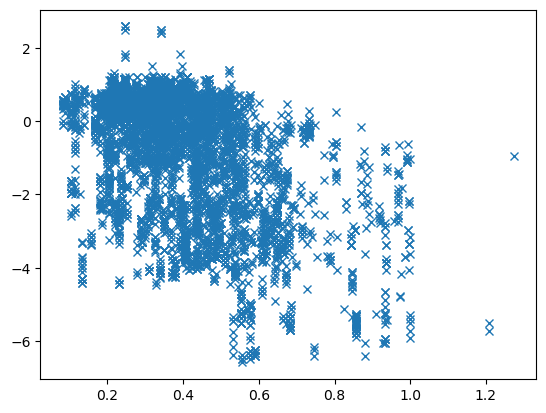

In [92]:
plt.plot(stn_buffers['BuSqC_mode'],stn_buffers['Temperature_diff_K'],'x')

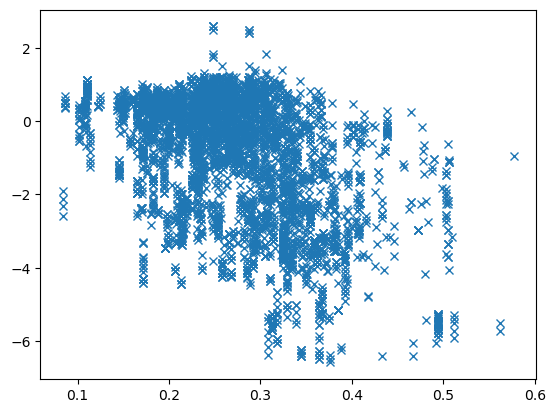

In [97]:
plt.plot(stn_buffers['BuHem_3D_mode'],stn_buffers['Temperature_diff_K'],'x')

In [86]:
stn_buffers['BuCube_3D_sum']

0       115.853829
1       100.860504
2       109.647754
3       110.544289
4        94.461245
           ...    
5936    104.503027
5937    109.667231
5938    113.362575
5939    118.469335
5940    118.478945
Name: BuCube_3D_sum, Length: 5941, dtype: float64

In [93]:
spearman_df

,parameter,spearman_r,spearman_p
0,station_id,-0.062695,1.324013e-06
1,BuAdj,-0.511025,0.000000e+00
2,BuIBD,-0.365099,4.416599e-160
3,BuAre_mean,0.399051,2.222858e-203
4,BuAre_median,0.252652,1.452514e-78
...,...,...,...
1452,BuCAR,0.659545,0.000000e+00
1453,SVF_3D_mean,-0.675960,0.000000e+00
1454,SVF_3D_std,0.654397,0.000000e+00
1455,SVF_3D_median,-0.663830,0.000000e+00


In [84]:
for i in spearman_df.sort_values(by='spearman_r', ascending=False).values:
    print(i)

['BuHt_wsum' 0.6761213481943459 0.0]
['BuVol_3D_sum' 0.6754564213413152 0.0]
['BuRough_3D_wsum' 0.6705932477284315 0.0]
['SVF_3D_IQR' 0.6664547862518001 0.0]
['BuOri_wsum' 0.6646673614236406 0.0]
['BuFF_wsum' 0.6635862339140829 0.0]
['BuSWA_3D_wsum' 0.663102455838475 0.0]
['BuFD_wsum' 0.6619793119996557 0.0]
['BumVE_3D_wsum' 0.6598605783699861 0.0]
['BuMVE_3D_wsum' 0.6598605783699861 0.0]
['BuCAR' 0.6595446026309225 0.0]
['BuAre_sum' 0.6595446026309225 0.0]
['BuEPI_3D_wsum' 0.6584623433188147 0.0]
['BuCon_3D_wsum' 0.6565672235880831 0.0]
['BuCon_wsum' 0.6554879387336681 0.0]
['SVF_3D_std' 0.6543966900566581 0.0]
['BuCubo_3D_wsum' 0.6540391666912686 0.0]
['BuEWR_3D_wsum' 0.6538528295067266 0.0]
['BuSA_3D_sum' 0.6528951911010734 0.0]
['BuERI_wsum' 0.6527256281975465 0.0]
['BuRough_wsum' 0.6525165271006846 0.0]
['BuRec_wsum' 0.6524134701790371 0.0]
['BuFra_wsum' 0.650948543953687 0.0]
['BuSqu_wsum' 0.6508714230153123 0.0]
['BuPerC_wsum' 0.6508714230153123 0.0]
['BuFra_3D_wsum' 0.650671033

In [88]:
spearman_df.to_csv('/Users/lisawink/Documents/paper1/data/processed_data/mbike/270623_spearman_correlation.csv')
spearman_df.to_excel('/Users/lisawink/Documents/paper1/data/processed_data/mbike/270623_spearman_correlation.xlsx')


In [71]:
spearman_df

,parameter,spearman_r,spearman_p


In [95]:
temp =  pd.read_csv('/Users/lisawink/Documents/paper1/data/gap_filled_data_ta_rh.csv')


In [96]:
temp

,datetime_UTC,station_id,variable,value,data_type
0,2022-09-01T00:00:00Z,FRASHA,Ta_deg_C,14.78,imputed
1,2022-09-01T00:00:00Z,FRBETZ,Ta_deg_C,16.85,observed
2,2022-09-01T00:00:00Z,FRBRUH,Ta_deg_C,16.33,observed
3,2022-09-01T00:00:00Z,FRDIET,Ta_deg_C,13.98,observed
4,2022-09-01T00:00:00Z,FRDREI,Ta_deg_C,16.61,observed
...,...,...,...,...,...
718602,2023-08-31T23:00:00Z,FRWEIN,RH_percent,53.87,observed
718603,2023-08-31T23:00:00Z,FRWILD,RH_percent,63.88,observed
718604,2023-08-31T23:00:00Z,FRWITT,RH_percent,57.70,observed
718605,2023-08-31T23:00:00Z,FRWSEE,RH_percent,69.00,observed
